# Sound propagation model data processing

This notebook brings in the sound propagation modeling results and links them to the occurrence records as produced from `presence_to_occurrence.ipynb`.

Sound propagation modeling data are available on Google Cloud at https://console.cloud.google.com/storage/browser/noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models;tab=objects?prefix=&forceOnObjectsSortingFiltering=false

We can use the [`gutil cp`](https://cloud.google.com/storage/docs/gsutil/commands/cp) command to recursively download files from Google Cloud to a local directory.

```
gutil cp -r gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/ci01/sanctsound_ci01_propmodeling/data/
```

But we only want the netCDF data and we only want the `sound_propagation` value.

```
ds = xr.open_dataset('SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc')
ds.variables['listening_range']

Out[6]:
<xarray.Variable (month: 1)>
array([2815])
Attributes:
    long_name:    distance_from_hydrophone_to_zero_SNR
    Description:  The median distance from the hydrophone to a zero signal-to...
    units:        m
```



In [2]:
import pandas as pd
import xarray as xr

# Function to download public files.

From https://cloud.google.com/storage/docs/access-public-data#storage-download-public-object-python

```
conda install google-cloud-storage
```

https://console.cloud.google.com/storage/browser/_details/noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/ci01/sanctsound_ci01_propmodeling/data/SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc;tab=live_object

Install `gsutil` from https://cloud.google.com/storage/docs/gsutil_install

and recusively download netCDF files from `noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models`

gsutil uri for one of the datasets is:
```
gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/ci01/sanctsound_ci01_propmodeling/data/SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc
```

Data citation:
```
NOAA National Centers for Environmental Information. 2017. Passive Acoustic Data Collection. NOAA National Centers for Environmental Information.
https://doi.org/10.25921/PF0H-SQ72. access date
```

In [6]:
# for one station
#!gcloud storage ls gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/sb03/**/*.nc
    
# for all stations

temp = !gcloud storage ls gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/**/*.nc

print(f'Found {len(temp)} files:')    

for file in temp:
    print(file.split('/')[-1])

Found 924 files:
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Jan_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Jul_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Oct_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ05000Hz_Apr_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ05000Hz_Jan_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ05000Hz_Jul_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ05000Hz_Oct_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0010m_SL185dB_FQ00125Hz_Apr_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0010m_SL185dB_FQ00125Hz_Jan_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0010m_SL185dB_FQ00125Hz_Jul_radarformat_highres.nc
SanctSound_CI01_propmodeling_SD0010m_SL185dB_FQ00125Hz_Oct_radarformat_highres.nc

In [ ]:
## BE CAREFUL WITH THIS >900 FILES!
#  Operation completed over 924 objects/103.2 GiB.       
# ==> NOTE: You are performing a sequence of gsutil operations that may
# run significantly faster if you instead use gsutil -m cp ... Please
# see the -m section under "gsutil help options" for further information
# about when gsutil -m can be advantageous.
#
# !gsutil cp gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/**/*.nc data\sound_propagation\

In [24]:
# # Might be able to use xarray to grab data from gc:

# url = 'gs://noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/**/*.nc'

# xr.open_mfdataset(url,
#                 engine="zarr", 
#                 #storage_options={'token': 'anon'}
#                )

# Match occurrence data with Sound propagation model

Now we can bring in the occurrence data and determine how to link the two resources together.

Reminder, occurrence data was collected from https://coastwatch.pfeg.noaa.gov/erddap/search/index.html?page=1&itemsPerPage=1000&searchFor=noaaSanctSound

In [4]:
df_occur = pd.read_csv('data/occurrence.zip', compression='zip')

df_occur.sample(n=5)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,propagationFrequency,site,occurrenceID
18006,2020-11-20,6,fin whale,urn:lsid:marinespecies.org:taxname:137091,Balaenoptera physalus,Species,Animalia,34.085230,-120.095700,20,CI02,siteCI02_station06_fin_whale_2020-11-20
4577,2019-06-20,2,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,31.396417,-80.890400,5000,GR01,siteGR01_station02_dolphin_2019-06-20
6485,2019-09-06,5,minke whale,urn:lsid:marinespecies.org:taxname:137087,Balaenoptera acutorostrata,Species,Animalia,42.470873,-70.242383,20,SB02,siteSB02_station05_minke_whale_2019-09-06
98,2018-11-08,1,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,33.849000,-120.118000,63,CI04,siteCI04_station01_blue_whale_2018-11-08
3037,2019-04-10,1,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,24.458950,-81.774133,5000,FK03,siteFK03_station01_dolphin_2019-04-10


Let's collect unique station and locality identifiers to match to propagation results.

In [5]:
df_occur['occurrenceID'].str.split('_',expand=True)[0].unique()

array(['siteCI01', 'siteCI02', 'siteCI04', 'siteCI05', 'siteSB01',
       'siteSB02', 'siteSB03', 'siteMB03', 'siteMB01', 'siteMB02',
       'siteGR01', 'siteFK01', 'siteFK03', 'siteFK02', 'siteOC02',
       'siteOC01', 'siteGR03', 'siteGR02', 'siteOC04', 'sitePM05',
       'siteCI03', 'siteOC03', 'siteHI03', 'siteHI04'], dtype=object)

# Investigate downloaded sound propagation files

We only downloaded a subset of the propagation model data for testing. There are **924** files, so we should explore how we might be able to do this work without downloading all the data.

What does our sound propagation model output look like? Let's look at the first file that we downloaded.

See <https://console.cloud.google.com/storage/browser/_details/noaa-passive-bioacoustic/sanctsound/products/sound_propagation_models/ci01/sanctsound_ci01_propmodeling/data/SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc;tab=live_object?inv=1&invt=AbxNFw>

In [4]:
import os

directory = 'data/sound_propagation/'

fname = os.listdir(directory)[0]

print(fname,'\n')

ds = xr.open_dataset(directory+fname, engine='netcdf4')

ds.info()

SanctSound_CI01_propmodeling_SD0001m_SL165dB_FQ01000Hz_Apr_radarformat_highres.nc 

xarray.Dataset {
dimensions:
	month = 1 ;
	depth = 1 ;
	bearing = 361 ;
	range = 13853 ;

variables:
	float64 month(month) ;
		month:long_name = month_of_climatological_sound_speed_profiles ;
		month:description = month # for GDEM sound speed profiles: 1-Jan, 2-Feb etc ;
		month:units = 1 ;
	float64 depth(depth) ;
		depth:long_name = sound_source_depth ;
		depth:description = Depth of the sound source ;
		depth:units = m ;
	float64 bearing(bearing) ;
		bearing:axis = Y ;
		bearing:long_name = true_north_bearing_from_hydrophone ;
		bearing:units = degrees_true ;
	float64 range(range) ;
		range:axis = X ;
		range:long_name = range_away_from_hydrophone ;
		range:units = km ;
	|S4 site() ;
		site:long_name = SanctSound_site_name ;
	float64 latitude(bearing, range) ;
		latitude:standard_name = latitude ;
		latitude:units = degrees_north ;
	float64 longitude(bearing, range) ;
		longitude:standard_name = longi

We know we want the data from the variable `listening_range`.

In [5]:
ds['listening_range']

<xarray.DataArray 'listening_range' (month: 1)>
[1 values with dtype=int32]
Coordinates:
  * month    (month) float64 4.0
Attributes:
    long_name:    distance_from_hydrophone_to_zero_SNR
    Description:  The median distance from the hydrophone to a zero signal-to...
    units:        m

Grab all the `listening_range` data (in meters) with filenames to see if we can match to the occurrence data

In [ ]:

df_listening_range = pd.DataFrame()

fnames = os.listdir(directory)

for fname in fnames:
    
    with xr.open_dataset(directory+fname, engine='netcdf4') as ds:
    
        df_temp = ds[['listening_range','depth','site']].to_dataframe().reset_index()

        # add additional data
        df_temp['fname'] = fname
        df_temp['site'] = df_temp['site'].values[0].decode('utf-8')
        df_temp['freq_Hz'] = int(ds.SoundSourcefrequency.replace('Hz','').strip())
        df_temp['hydrophone_depth_m'] = ds.HydrophoneDepth.replace('m','').strip()
        df_temp.rename(columns={'listening_range':'listening_range_m','month':'climatology'}, inplace=True)
        
        df_listening_range = pd.concat([df_listening_range, df_temp])
        
df_listening_range.sample(n=5)

,climatology,depth,listening_range_m,site,fname,freq_Hz,hydrophone_depth_m
0,10.0,19.0,7565,CI01,SanctSound_CI01_propmodeling_SD0019m_SL176dB_F...,12000,17.5
0,1.0,20.0,8177,PM08,SanctSound_PM08_propmodeling_SD0020m_SL170dB_F...,300,1097.0
0,1.0,81.0,8195,HI04,SanctSound_HI04_propmodeling_SD0081m_SL176dB_F...,12000,81.0
0,7.0,10.0,117991,FK01,SanctSound_FK01_propmodeling_SD0010m_SL185dB_F...,125,14.0
0,1.0,10.0,37197,HI05,SanctSound_HI05_propmodeling_SD0010m_SL185dB_F...,125,48.0


Find occurrence records associated with the station `CI01`.

In [14]:
df_occur.loc[df_occur['occurrenceID'].str.contains('CI01')].sample(n=5)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,propagationFrequency,site,occurrenceID
5018,2019-07-10,2,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,34.0438,-120.08105,5000,CI01,siteCI01_station02_dolphin_2019-07-10
14679,2020-07-13,5,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,34.0463,-120.08073,300,CI01,siteCI01_station05_plainfin_midshipman_2020-07-13
21155,2021-07-27,8,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,34.0436,-120.08030,300,CI01,siteCI01_station08_plainfin_midshipman_2021-07-27
4491,2019-06-17,2,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,34.0438,-120.08105,300,CI01,siteCI01_station02_plainfin_midshipman_2019-06-17
5578,2019-08-03,2,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,34.0438,-120.08105,63,CI01,siteCI01_station02_blue_whale_2019-08-03


Now find the **listening ranges** for station `CI01` for the January and April climatology (month = 1.0, month = 4.0).

In [8]:
df_listening_range.loc[(df_listening_range['site']=='CI01') & (df_listening_range['climatology']<5)].sort_values(by=['climatology','freq_Hz'])

,climatology,depth,listening_range_m,site,fname,freq_Hz,hydrophone_depth_m
0,1.0,15.0,4861,CI01,SanctSound_CI01_propmodeling_SD0015m_SL189dB_F...,20,17.5
0,1.0,20.0,15001,CI01,SanctSound_CI01_propmodeling_SD0020m_SL192dB_F...,63,17.5
0,1.0,10.0,18270,CI01,SanctSound_CI01_propmodeling_SD0010m_SL185dB_F...,125,17.5
0,1.0,20.0,9492,CI01,SanctSound_CI01_propmodeling_SD0020m_SL170dB_F...,300,17.5
0,1.0,1.0,4593,CI01,SanctSound_CI01_propmodeling_SD0001m_SL165dB_F...,1000,17.5
0,1.0,1.0,3028,CI01,SanctSound_CI01_propmodeling_SD0001m_SL165dB_F...,5000,17.5
0,1.0,19.0,7325,CI01,SanctSound_CI01_propmodeling_SD0019m_SL176dB_F...,12000,17.5
0,4.0,15.0,4815,CI01,SanctSound_CI01_propmodeling_SD0015m_SL189dB_F...,20,17.5
0,4.0,20.0,15001,CI01,SanctSound_CI01_propmodeling_SD0020m_SL192dB_F...,63,17.5
0,4.0,10.0,18270,CI01,SanctSound_CI01_propmodeling_SD0010m_SL185dB_F...,125,17.5


Let's look at the SanctSound website and see how we might be able to link these together.

https://sanctsound.portal.axds.co/#sanctsound/sanctuary/channel-islands/site/CI01

Since propagation model data are separated into quarterly observations on months 1, 4, 7, and 10. We can use pandas to group by quarters starting in January.

But first, we need to make a consistent `site` variable for the mapping.

In [9]:
df_occur['eventDate'] = pd.to_datetime(df_occur['eventDate'])

df_occur['site'] = df_occur['occurrenceID'].str.split("_",expand=True)[0].str.replace("site","")

df_occur.sample(5)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,propagationFrequency,site,occurrenceID
14768,2020-07-17,3,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,36.37021,-122.314903,63,MB03,siteMB03_station03_blue_whale_2020-07-17
10664,2020-01-20,2,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,33.48687,-119.016090,5000,CI03,siteCI03_station02_dolphin_2020-01-20
9014,2019-11-21,3,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,36.79800,-121.976000,63,MB01,siteMB01_station03_blue_whale_2019-11-21
14789,2020-07-19,5,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,34.04630,-120.080730,300,CI01,siteCI01_station05_plainfin_midshipman_2020-07-19
9325,2019-12-02,2,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,36.37021,-122.314903,5000,MB03,siteMB03_station02_dolphin_2019-12-02


Map the months to the appropriate climatology

Months | Climatology
-------|------------
1,2,3 | 1
4,5,6 | 4
7,8,9 | 7
10,11,12 | 10

See this gist for confirmation they line up: <https://gist.github.com/ocefpaf/412a6ddcfa3524862160653f1718da5f>

In [10]:
df_occur['climatology'] = pd.Series(dtype=float)

mask = (df_occur['eventDate'].dt.quarter==1)

df_occur.loc[mask,'climatology'] = 1

mask = (df_occur['eventDate'].dt.quarter==2)

df_occur.loc[mask,'climatology'] = 4

mask = (df_occur['eventDate'].dt.quarter==3)

df_occur.loc[mask,'climatology'] = 7

mask = (df_occur['eventDate'].dt.quarter==4)

df_occur.loc[mask, 'climatology'] = 10

df_occur.sample(5)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,propagationFrequency,site,occurrenceID,climatology
15177,2020-08-06,10,minke whale,urn:lsid:marinespecies.org:taxname:137087,Balaenoptera acutorostrata,Species,Animalia,42.254985,-70.179125,20,SB03,siteSB03_station10_minke_whale_2020-08-06,7.0
309,2018-11-18,1,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,33.849000,-120.118000,300,CI04,siteCI04_station01_humpback_whale_2018-11-18,10.0
2415,2019-03-12,1,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,24.458950,-81.774133,5000,FK03,siteFK03_station01_dolphin_2019-03-12,1.0
14575,2020-07-05,3,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,33.486870,-119.016090,300,CI03,siteCI03_station03_plainfin_midshipman_2020-07-05,7.0
15352,2020-08-13,10,minke whale,urn:lsid:marinespecies.org:taxname:137087,Balaenoptera acutorostrata,Species,Animalia,42.254985,-70.179125,20,SB03,siteSB03_station10_minke_whale_2020-08-13,7.0


# Do the combining

 Use [DataFrame.merge](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html) to combine the datasets together.
 
 First, however, we pick an appropriate frequency. Luckily, we can already collected the frequency in the [SanctSound_SpeciesLookupTable.csv](https://github.com/MathewBiddle/bio_data_guide/blob/main/datasets/SanctSound/SanctSound_SpeciesLookupTable.csv), under the `propagationFrequency` column. 
 
 These frequencies we determined based on the approximate ranges by which calls are typically observed for each species. It is a 'best guess'.

In [11]:
df_occur.rename(columns={'propagationFrequency':'freq_Hz'}, inplace=True)

df_combined = df_occur.merge(df_listening_range,how='left', on=['site','climatology','freq_Hz'], indicator=True)

df_combined.sample(10)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,freq_Hz,site,occurrenceID,climatology,depth,listening_range_m,fname,hydrophone_depth_m,_merge
3818,2019-05-14,2,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,31.367490,-80.895000,5000,GR03,siteGR03_station02_dolphin_2019-05-14,4.0,1.0,2750,SanctSound_GR03_propmodeling_SD0001m_SL165dB_F...,16.0,both
21630,2021-08-30,8,fin whale,urn:lsid:marinespecies.org:taxname:137091,Balaenoptera physalus,Species,Animalia,33.848500,-120.115900,20,CI04,siteCI04_station08_fin_whale_2021-08-30,7.0,15.0,96082,SanctSound_CI04_propmodeling_SD0015m_SL189dB_F...,152.5,both
4884,2019-07-03,2,bocaccio,urn:lsid:marinespecies.org:taxname:274833,Sebastes paucispinis,Species,Animalia,36.649500,-121.908400,300,MB02,siteMB02_station02_bocaccio_2019-07-03,7.0,20.0,8741,SanctSound_MB02_propmodeling_SD0020m_SL170dB_F...,64.5,both
1443,2019-01-02,1,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,42.255410,-70.178607,300,SB03,siteSB03_station01_humpback_whale_2019-01-02,1.0,20.0,31030,SanctSound_SB03_propmodeling_SD0020m_SL170dB_F...,42.0,both
6157,2019-08-27,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,42.470873,-70.242383,300,SB02,siteSB02_station05_humpback_whale_2019-08-27,7.0,20.0,76478,SanctSound_SB02_propmodeling_SD0020m_SL170dB_F...,66.0,both
1995,2019-02-10,1,bocaccio,urn:lsid:marinespecies.org:taxname:274833,Sebastes paucispinis,Species,Animalia,36.798000,-121.976000,300,MB01,siteMB01_station01_bocaccio_2019-02-10,1.0,20.0,15909,SanctSound_MB01_propmodeling_SD0020m_SL170dB_F...,115.5,both
16202,2020-09-19,4,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,33.486750,-119.016070,300,CI03,siteCI03_station04_plainfin_midshipman_2020-09-19,7.0,20.0,11186,SanctSound_CI03_propmodeling_SD0020m_SL170dB_F...,22.7,both
9748,2019-12-16,2,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,47.317900,-124.416600,300,OC03,siteOC03_station02_humpback_whale_2019-12-16,10.0,20.0,25900,SanctSound_OC03_propmodeling_SD0020m_SL170dB_F...,31.5,both
17417,2020-11-01,6,pinniped,urn:lsid:marinespecies.org:taxname:148736),Pinnipedia,Infraorder,Animalia,34.085230,-120.095700,1000,CI02,siteCI02_station06_pinniped_2020-11-01,10.0,1.0,6899,SanctSound_CI02_propmodeling_SD0001m_SL165dB_F...,73.5,both
18149,2020-11-25,6,fin whale,urn:lsid:marinespecies.org:taxname:137091,Balaenoptera physalus,Species,Animalia,34.085230,-120.095700,20,CI02,siteCI02_station06_fin_whale_2020-11-25,10.0,15.0,102351,SanctSound_CI02_propmodeling_SD0015m_SL189dB_F...,73.5,both


Check to make sure the merge was successful. Should only have `both` in the **_merge** column.

In [12]:
df_combined['_merge'].unique().tolist()

['both']

# QA/QC

### Depth check against GEBCO

Metadata - https://coastwatch.pfeg.noaa.gov/erddap/info/GEBCO_2020/index.html

Summary:
The GEBCO_2020 Grid is the latest global bathymetric product released by the General Bathymetric Chart of the Oceans (GEBCO) and has been developed through the Nippon Foundation-GEBCO Seabed 2030 Project. This is a collaborative project between the Nippon Foundation of Japan and GEBCO. The Seabed 2030 Project aims to bring together all available bathymetric data to produce the definitive map of the world ocean floor and make it available to all.

In [13]:
import numpy as np

def etopo_depth(df):
    
    df['bathy'] = np.nan
    
    for index, row in df.iterrows():
        base_url = 'https://coastwatch.pfeg.noaa.gov/erddap/griddap/GEBCO_2020.csvp?'
        query_url = 'elevation%5B({})%5D%5B({})%5D'.format(row['decimalLatitude'],row['decimalLongitude'])
        url = base_url+query_url
        bathy = pd.read_csv(url)
        
        df.at[index,'bathy'] = bathy['elevation (m)']

    return df

In [14]:
df_coords = df_combined[['decimalLatitude','decimalLongitude']].copy()

df_group = df_coords.groupby(['decimalLatitude','decimalLongitude']).size().reset_index().rename(columns={0:'count'})

df_bathy = etopo_depth(df_group)

df_bathy

,decimalLatitude,decimalLongitude,count,bathy
0,21.285420,-157.600120,184,-80.0
1,22.263472,-159.586389,160,-83.0
2,24.433130,-81.930680,373,-31.0
3,24.458950,-81.774133,129,-30.0
4,24.488800,-81.666316,111,-14.0
...,...,...,...,...
114,48.393800,-124.620670,180,-39.0
115,48.490300,-125.003700,126,-92.0
116,48.490400,-125.003800,20,-92.0
117,48.490450,-124.003500,194,495.0


In [15]:
#df_combined['neg_maximumDepthInMeters'] = -1*df_combined['depth']
   
print('Stations where depth is deeper than GEBCO bathymetry:')

df_merged = df_combined.merge(df_bathy, how='left', on=['decimalLatitude','decimalLongitude'])

print(df_merged.loc[df_merged['depth'] < df_merged['bathy'],'station'].unique())

df_merged.loc[df_merged['depth'] < df_merged['bathy'], ['depth','bathy']]

Stations where depth is deeper than GEBCO bathymetry:
[5]


,depth,bathy
20790,20.0,495.0
20798,20.0,495.0
20803,20.0,495.0
20810,20.0,495.0
20811,1.0,495.0
...,...,...
22497,20.0,495.0
22511,20.0,495.0
22525,20.0,495.0
22538,20.0,495.0


# Do some checking that the coordinate pairs are valid. 

According to the test above there is one station that has a depth value deeper than the GEBCO bathymetry (`OC02_05`). So we need to check that one.

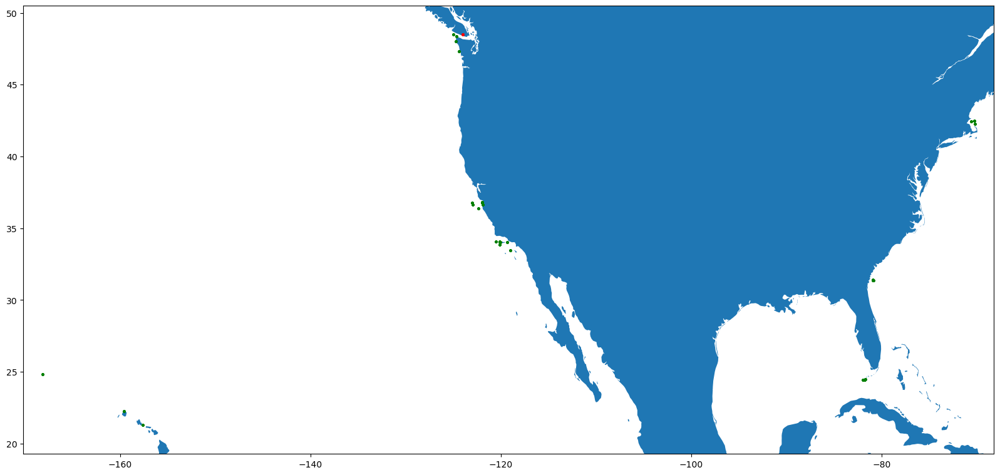

In [16]:
import cartopy.io.shapereader as shpreader
import geopandas as gpd
import shapely.geometry as sgeom
from shapely.ops import unary_union
from shapely.prepared import prep
import matplotlib.pyplot as plt

df = df_combined #.loc[df_merged['depth'] < df_merged['bathy']]

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.decimalLongitude, df.decimalLatitude), crs='WGS84')
   
land_shp_fname = shpreader.natural_earth(resolution='50m',
                                       category='physical', name='land')
   
land_geom = unary_union(list(shpreader.Reader(land_shp_fname).geometries()))
land = prep(land_geom)
   
for index, row in gdf.iterrows():
    gdf.loc[index, 'on_land'] = land.contains(row.geometry)
   
fig, axs = plt.subplots(figsize=(20,20))#ncols=1,nrows=1)

# Make a map:
xlim = ([gdf.total_bounds[0]-2,  gdf.total_bounds[2]+2])
ylim = ([gdf.total_bounds[1]-2,  gdf.total_bounds[3]+2])

axs.set_xlim(xlim)
axs.set_ylim(ylim)

gpd.read_file(land_shp_fname).plot(ax=axs)
   
gdf.loc[gdf['on_land']==False].plot(ax=axs, color='green', markersize=3)
gdf.loc[gdf['on_land']==True].plot(ax=axs, color='red', markersize=3)

plt.show()

In [17]:
gdf.loc[gdf['on_land']==True]

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,freq_Hz,site,occurrenceID,climatology,depth,listening_range_m,fname,hydrophone_depth_m,_merge,geometry,on_land
20790,2021-06-09,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-06-09,4.0,20.0,44531,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.5,both,POINT (-124.00350 48.49045),True
20798,2021-06-10,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-06-10,4.0,20.0,44531,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.5,both,POINT (-124.00350 48.49045),True
20803,2021-06-11,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-06-11,4.0,20.0,44531,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.5,both,POINT (-124.00350 48.49045),True
20810,2021-06-12,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-06-12,4.0,20.0,44531,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.5,both,POINT (-124.00350 48.49045),True
20811,2021-06-12,5,killer whale,urn:lsid:marinespecies.org:taxname:137102,Orcinus orca,Species,Animalia,48.49045,-124.0035,1000,OC02,siteOC02_station05_killer_whale_2021-06-12,4.0,1.0,7991,SanctSound_OC02_propmodeling_SD0001m_SL165dB_F...,90.5,both,POINT (-124.00350 48.49045),True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22497,2021-10-23,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-10-23,10.0,20.0,44050,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.0,both,POINT (-124.00350 48.49045),True
22511,2021-10-24,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-10-24,10.0,20.0,44050,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.0,both,POINT (-124.00350 48.49045),True
22525,2021-10-25,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-10-25,10.0,20.0,44050,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.0,both,POINT (-124.00350 48.49045),True
22538,2021-10-26,5,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,48.49045,-124.0035,300,OC02,siteOC02_station05_humpback_whale_2021-10-26,10.0,20.0,44050,SanctSound_OC02_propmodeling_SD0020m_SL170dB_F...,90.0,both,POINT (-124.00350 48.49045),True


On the map we see a red dot for one station. Looking at the data where the `on_land` flag is `True` we can see this confirms our previous GEBCO test. Station OC02_05 has coordinates on land.

Next lets make an interactive map to explore the specific location of this station.

In [18]:
gdf[['geometry','on_land','occurrenceID']].explore("on_land", cmap="RdYlGn_r",popup=True)

Now, lets do some digging into the data to figure out if it's a data munging error or something we're pulling directly from the source.

Below, we set the date column as the index to do easier date searching. Then we look for entries with the `occurrenceID` in the map above and we return the sound propagation file name.

In [19]:
temp = df_combined.set_index(pd.to_datetime(df_combined['eventDate']))

temp.loc[temp['occurrenceID']=='siteOC02_station05_humpback_whale_2021-10-27','fname'].tolist()

['SanctSound_OC02_propmodeling_SD0020m_SL170dB_FQ00300Hz_Oct_radarformat_highres.nc']

Using that file name, let's take a look at the sound propagation data to see if the coordinates match what we have.

In [20]:
ds = xr.open_dataset('data/sound_propagation/SanctSound_OC02_propmodeling_SD0020m_SL170dB_FQ00300Hz_Oct_radarformat_highres.nc')

print(ds.HydrophoneLocationLatitude,ds.HydrophoneLocationLongitude)

  48.49040 degrees_north -125.00380 degrees_east


In [21]:
df_combined.loc[(df_combined['site']=='OC02') & (df_combined['station']==5),['decimalLatitude','decimalLongitude']].groupby(by=['decimalLatitude','decimalLongitude']).count()

,
decimalLatitude,decimalLongitude
48.49045,-124.0035


In [22]:
from shapely.geometry import Point
import geopandas as gpd
pnt1 = Point(-125.00380, 48.49040 )
pnt2 = Point( -124.0035, 48.49045)
points_df = gpd.GeoDataFrame({'geometry': [pnt1, pnt2], 'name':['prop model','erddap']}, crs='EPSG:4326')

points_df.explore('name',cmap='jet')

Calculate the distance between the two points in meters.

In [23]:
points_df = points_df.to_crs('EPSG:2957')
points_df2 = points_df.shift().to_crs('EPSG:2957')
points_df.distance(points_df2)

C:\Users\Mathew.Biddle\programs\Miniforge\envs\sandbox\lib\site-packages\geopandas\array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as NAD83(CSRS) / UTM zone 13N (the single non-null crs provided).
  warnings.warn(


0             NaN
1    75791.271018
dtype: float64

Our source data for this observation is coming from [this ERDDAP dataset](https://coastwatch.pfeg.noaa.gov/erddap/info/noaaSanctSound_OC02_05_humpbackwhale_1d/index.html), the `geospatial_bounds` attribute.

The question is, which one do we **trust**?

For now we will leave in the coordinates from the ERDDAP dataset, so we're consistant in the way we are collecting the information for all the stations. 

After correspondance with the PI, the coordinates from the propagation modeling data are the correct coordinates. So, lets change the coordinates to use the ones from the netCDF file we opened above. 

In [24]:
df_replace_coords = df_combined.copy()

df_replace_coords.drop(columns=['geometry','on_land'],inplace=True)

df_replace_coords.loc[(df_replace_coords['site']=='OC02') & (df_replace_coords['station']==5),['decimalLatitude']] = float(ds.HydrophoneLocationLatitude.replace(" degrees_north",""))

df_replace_coords.loc[(df_replace_coords['site']=='OC02') & (df_replace_coords['station']==5),['decimalLatitude']]

,decimalLatitude
20790,48.4904
20798,48.4904
20803,48.4904
20810,48.4904
20811,48.4904
...,...
22497,48.4904
22511,48.4904
22525,48.4904
22538,48.4904


In [25]:
df_replace_coords.loc[(df_replace_coords['site']=='OC02') & (df_replace_coords['station']==5),['decimalLongitude']] = float(ds.HydrophoneLocationLongitude.replace(" degrees_east",""))

df_replace_coords.loc[(df_replace_coords['site']=='OC02') & (df_replace_coords['station']==5),['decimalLongitude']]

,decimalLongitude
20790,-125.0038
20798,-125.0038
20803,-125.0038
20810,-125.0038
20811,-125.0038
...,...
22497,-125.0038
22511,-125.0038
22525,-125.0038
22538,-125.0038


In [26]:
df_replace_coords.loc[(df_replace_coords['site']=='OC02') & (df_replace_coords['station']==5),['decimalLatitude','decimalLongitude']].groupby(by=['decimalLatitude','decimalLongitude']).count()

,
decimalLatitude,decimalLongitude
48.4904,-125.0038


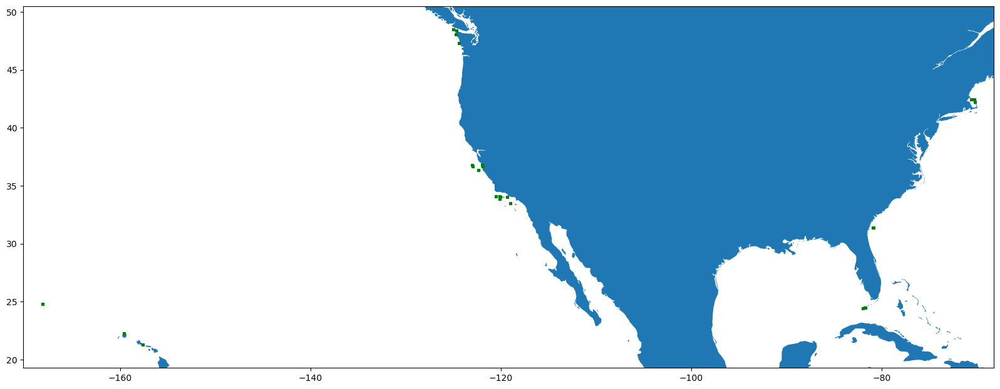

In [27]:
import cartopy.io.shapereader as shpreader
import geopandas as gpd
import shapely.geometry as sgeom
from shapely.ops import unary_union
from shapely.prepared import prep
import matplotlib.pyplot as plt

df = df_replace_coords.copy() #.loc[df_merged['depth'] < df_merged['bathy']]

gdf_replace_coords = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.decimalLongitude, df.decimalLatitude), crs='WGS84')
   
land_shp_fname = shpreader.natural_earth(resolution='50m',
                                       category='physical', name='land')
   
land_geom = unary_union(list(shpreader.Reader(land_shp_fname).geometries()))
land = prep(land_geom)
   
for index, row in gdf_replace_coords.iterrows():
    gdf_replace_coords.loc[index, 'on_land'] = land.contains(row.geometry)
   
fig, axs = plt.subplots(figsize=(20,20))#ncols=1,nrows=1)

# Make a map:
xlim = ([gdf.total_bounds[0]-2,  gdf.total_bounds[2]+2])
ylim = ([gdf.total_bounds[1]-2,  gdf.total_bounds[3]+2])

axs.set_xlim(xlim)
axs.set_ylim(ylim)

gpd.read_file(land_shp_fname).plot(ax=axs)
   
gdf_replace_coords.loc[gdf_replace_coords['on_land']==False].plot(ax=axs, color='green', markersize=5)
if len(gdf_replace_coords.loc[gdf_replace_coords['on_land']==True]) > 0:
    gdf_replace_coords.loc[gdf_replace_coords['on_land']==True].plot(ax=axs, color='red', markersize=1)

plt.show()

In [28]:
gdf_replace_coords[['geometry','on_land','occurrenceID']].explore("on_land", cmap="RdYlGn_r",popup=True)

# DarwinCore alignment

Add in missing columns
Rename columns that aren't DwC

Also check for other items at https://ioos.github.io/bio_mobilization_workshop/06-qa-qc/index.html#recommended-initial-checks-on-your-data

Rename listening range for DarwinCore alignment

In [29]:
df_replace_coords.columns.tolist()

['eventDate',
 'station',
 'vernacularName',
 'scientificNameID',
 'scientificName',
 'taxonRank',
 'kingdom',
 'decimalLatitude',
 'decimalLongitude',
 'freq_Hz',
 'site',
 'occurrenceID',
 'climatology',
 'depth',
 'listening_range_m',
 'fname',
 'hydrophone_depth_m',
 '_merge']

In [30]:
df_replace_coords.rename(columns={'listening_range_m':'coordinateUncertaintyInMeters'}, inplace=True)

## Check for missing **required** fields

In [31]:
req_cols = ['occurrenceID','countryCode', 'kingdom', 'geodeticDatum', 'eventDate', 'decimalLongitude', 'decimalLatitude', 'scientificName', 'scientificNameID', 'occurrenceStatus', 'basisOfRecord']
missing_cols = []
for col in req_cols:
    if col not in df_replace_coords.columns:
        print('Column {} is missing.'.format(col))

#missing_cols

Column countryCode is missing.
Column geodeticDatum is missing.
Column occurrenceStatus is missing.
Column basisOfRecord is missing.


Add the columns and check again.

In [32]:
df_replace_coords['countryCode'] = 'US'
df_replace_coords['geodeticDatum'] = 'WGS84'
df_replace_coords['occurrenceStatus'] = 'present'
df_replace_coords['basisOfRecord'] = 'MachineObservation'

req_cols = ['occurrenceID','countryCode', 'kingdom', 'geodeticDatum', 'eventDate', 'decimalLongitude', 'decimalLatitude', 'scientificName', 'scientificNameID', 'occurrenceStatus', 'basisOfRecord']
missing_cols = []
for col in req_cols:
    if col not in df_replace_coords.columns:
        missing_cols.append('Column {} is missing.'.format(col))

missing_cols

[]

# Check dates

In [33]:
for date in df_replace_coords['eventDate']:
    try:
        pd.to_datetime(date)
    except:
        print("Date",date,"might not follow ISO 8601")

# Determine which columns aren't DwC and decide what to 

You can find the list of terms at <https://github.com/tdwg/dwc/blob/master/vocabulary/term_versions.csv>

In [35]:
df_dwc_terms = pd.read_csv('https://raw.githubusercontent.com/tdwg/dwc/master/vocabulary/term_versions.csv')

print("Not valid DwC terms:")
for term in df_replace_coords.columns.tolist():
    
    if not df_dwc_terms['term_localName'].str.contains(term).any():
        
        print(f'\t{term}')


Not valid DwC terms:
	station
	freq_Hz
	site
	climatology
	depth
	fname
	hydrophone_depth_m
	_merge


Let's move `depth` to [minimumDepthInMeters](https://dwc.tdwg.org/terms/#dwc:minimumDepthInMeters) and [maximumDepthInMeters](https://dwc.tdwg.org/terms/#dwc:maximumDepthInMeters) as it "is approximately the depth of the observed species".

In [87]:
df_replace_coords['maximumDepthInMeters'] = df_replace_coords['depth']
df_replace_coords['minimumDepthInMeters'] = df_replace_coords['depth']

df_replace_coords[['maximumDepthInMeters','minimumDepthInMeters','depth']].head()

,maximumDepthInMeters,minimumDepthInMeters,depth
0,20.0,20.0,20.0
1,20.0,20.0,20.0
2,20.0,20.0,20.0
3,20.0,20.0,20.0
4,20.0,20.0,20.0


In [88]:
df_replace_coords['eventID'] = df_replace_coords['site'] + "_" + df_replace_coords['station'].astype(str) + "_" + df_replace_coords['eventDate'].dt.strftime('%Y-%m-%d')

df_replace_coords['eventID']

0        CI01_1_2018-11-01
1        CI01_1_2018-11-01
2        CI01_1_2018-11-01
3        CI02_1_2018-11-01
4        CI02_1_2018-11-01
               ...        
22923    CI03_7_2021-12-31
22924    CI03_7_2022-01-02
22925    CI03_7_2022-01-03
22926    CI03_7_2022-01-04
22927    CI03_7_2022-01-07
Name: eventID, Length: 22928, dtype: object

Add sampling protocol. For now we are putting in "passive acoustic monitoring". But, we'd like to have a DOI or something more permanent.

In [93]:
df_replace_coords['samplingProtocol'] = "passive acoustic monitoring"
df_replace_coords['associatedReferences'] = ds.references

In [94]:
df_replace_coords.head(20)

,eventDate,station,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,freq_Hz,...,_merge,countryCode,geodeticDatum,occurrenceStatus,basisOfRecord,eventID,maximumDepthInMeters,minimumDepthInMeters,samplingProtocol,associatedReferences
0,2018-11-01,1,bocaccio,urn:lsid:marinespecies.org:taxname:274833,Sebastes paucispinis,Species,Animalia,34.0438,-120.0811,300,...,both,US,WGS84,present,MachineObservation,CI01_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
1,2018-11-01,1,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,34.0438,-120.0811,300,...,both,US,WGS84,present,MachineObservation,CI01_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
2,2018-11-01,1,plainfin midshipman,urn:lsid:marinespecies.org:taxname:275658,Porichthys notatus,Species,Animalia,34.0438,-120.0811,300,...,both,US,WGS84,present,MachineObservation,CI01_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
3,2018-11-01,1,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,34.0856,-120.5232,63,...,both,US,WGS84,present,MachineObservation,CI02_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
4,2018-11-01,1,bocaccio,urn:lsid:marinespecies.org:taxname:274833,Sebastes paucispinis,Species,Animalia,34.0856,-120.5232,300,...,both,US,WGS84,present,MachineObservation,CI02_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
5,2018-11-01,1,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,33.8490,-120.1180,63,...,both,US,WGS84,present,MachineObservation,CI04_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
6,2018-11-01,1,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,33.8490,-120.1180,300,...,both,US,WGS84,present,MachineObservation,CI04_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
7,2018-11-01,1,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,34.0178,-119.3172,63,...,both,US,WGS84,present,MachineObservation,CI05_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
8,2018-11-01,1,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,34.0178,-119.3172,300,...,both,US,WGS84,present,MachineObservation,CI05_1_2018-11-01,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
9,2018-11-02,1,bocaccio,urn:lsid:marinespecies.org:taxname:274833,Sebastes paucispinis,Species,Animalia,34.0438,-120.0811,300,...,both,US,WGS84,present,MachineObservation,CI01_1_2018-11-02,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."


In [95]:
len(df_replace_coords['occurrenceID'].unique())

22928

# Move additional data to extended measurement or fact extension

See <https://ioos.github.io/bio_mobilization_workshop/04-create-schema.html#occurrence-core-extensions>

include sound source level - from file name - `SL170dB`

Frequency - `FQ00300Hz`

add depths to eMoF - included hydrophone depth data

`SanctSound_OC02_propmodeling_SD0020m_SL170dB_FQ00300Hz_Oct_radarformat_highres.nc`

Will need eventID, but also includes occurrenceID. DONE eg. `CI01_1_2018-11-01`.

Note: _This will take a long time as we are making a dataframe 22928 x 8._

In [ ]:
df_emof = pd.DataFrame(columns=['measurementDeterminedDate','measurementType',
                                'measurementValue','measurementUnit',
                                'measurementTypeID','measurementUnitID'])

#for each occurrenceID create rows for each measurement or fact

df = df_replace_coords.copy()

for occur in df['occurrenceID'].unique():
    
    #error checking. We know there should be unique values of each emof per occurrence
    if len(df.loc[df['occurrenceID']==occur,'hydrophone_depth_m']) != 1:
        print('hydrophone_depth_m not unique for {}'.format(occur))
        break
    elif len(df.loc[df['occurrenceID']==occur,'freq_Hz']) != 1:
        print('freq_Hz not unique for {}'.format(occur))
        break
    elif len(df.loc[df['occurrenceID']==occur,'fname'].str.split("_",expand=True)[4].str.replace("SL","").str.replace("dB","")) != 1:
        print('fname not unique for {}'.format(occur))
        break
    
    
    
    # Hydrophone depth data
    df_temp=pd.DataFrame()

    df_temp['eventID'] = df.loc[df['occurrenceID']==occur,'eventID']
    df_temp['occurrenceID'] = df.loc[df['occurrenceID']==occur,'occurrenceID']
    df_temp['measurementDeterminedDate'] = df.loc[df['occurrenceID']==occur,'eventDate']
    df_temp['measurementValue'] = df.loc[df['occurrenceID']==occur,'hydrophone_depth_m']
    df_temp['measurementType'] = 'Moored instrument depth'
    df_temp['measurementTypeID'] = 'http://vocab.nerc.ac.uk/collection/P02/current/MPMN/'
    df_temp['measurementUnit'] = 'meters'
    df_temp['measurementUnitID'] = 'http://vocab.nerc.ac.uk/collection/P06/current/ULAA/'    
    
    # freqency data
    df_temp2=pd.DataFrame()
    
    df_temp2['eventID'] = df.loc[df['occurrenceID']==occur,'eventID']
    df_temp2['occurrenceID'] = df.loc[df['occurrenceID']==occur,'occurrenceID']
    df_temp2['measurementDeterminedDate'] = df.loc[df['occurrenceID']==occur,'eventDate']
    df_temp2['measurementValue'] = df.loc[df['occurrenceID']==occur,'freq_Hz']
    df_temp2['measurementType'] = 'Acoustic Frequency'
    df_temp2['measurementTypeID'] = 'http://vocab.nerc.ac.uk/collection/P14/current/GVAR0007/'
    df_temp2['measurementUnit'] = 'Hz'
    df_temp2['measurementUnitID'] = 'http://vocab.nerc.ac.uk/collection/P06/current/UTHZ/'  
    
    # sound levels (eg. SL189dB)
    df_temp3=pd.DataFrame()
    
    df_temp3['eventID'] = df.loc[df['occurrenceID']==occur,'eventID']
    df_temp3['occurrenceID'] = df.loc[df['occurrenceID']==occur,'occurrenceID']
    df_temp3['measurementDeterminedDate'] = df.loc[df['occurrenceID']==occur,'eventDate']
    df_temp3['measurementValue'] = df.loc[df['occurrenceID']==occur,'fname'].str.split("_",expand=True)[4].str.replace("SL","").str.replace("dB","")
    df_temp3['measurementType'] = 'Sound Pressure Level'
    df_temp3['measurementTypeID'] = 'http://vocab.nerc.ac.uk/collection/S06/current/S0600238/'
    df_temp3['measurementUnit'] = 'decibel (dB)'
    df_temp3['measurementUnitID'] = 'http://vocab.nerc.ac.uk/collection/P06/current/UDBL/'
    
    df_emof = pd.concat([df_emof,df_temp,df_temp2,df_temp3])
    #break
    
df_emof

,measurementDeterminedDate,measurementType,measurementValue,measurementUnit,measurementTypeID,measurementUnitID,eventID,occurrenceID
0,2018-11-01,Moored instrument depth,17.5,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI01_1_2018-11-01,siteCI01_station01_bocaccio_2018-11-01
0,2018-11-01,Acoustic Frequency,300,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI01_1_2018-11-01,siteCI01_station01_bocaccio_2018-11-01
0,2018-11-01,Sound Pressure Level,170,decibel (dB),http://vocab.nerc.ac.uk/collection/S06/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI01_1_2018-11-01,siteCI01_station01_bocaccio_2018-11-01
1,2018-11-01,Moored instrument depth,17.5,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI01_1_2018-11-01,siteCI01_station01_humpback_whale_2018-11-01
1,2018-11-01,Acoustic Frequency,300,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI01_1_2018-11-01,siteCI01_station01_humpback_whale_2018-11-01
...,...,...,...,...,...,...,...,...
22926,2022-01-04,Acoustic Frequency,20,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI03_7_2022-01-04,siteCI03_station07_fin_whale_2022-01-04
22926,2022-01-04,Sound Pressure Level,189,decibel (dB),http://vocab.nerc.ac.uk/collection/S06/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI03_7_2022-01-04,siteCI03_station07_fin_whale_2022-01-04
22927,2022-01-07,Moored instrument depth,22.7,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI03_7_2022-01-07,siteCI03_station07_fin_whale_2022-01-07
22927,2022-01-07,Acoustic Frequency,20,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI03_7_2022-01-07,siteCI03_station07_fin_whale_2022-01-07


# Save occurrence and emof record

But first, lets remove the columns we don't need in the occurrence table.

In [103]:
columns = ['station','freq_Hz','site','climatology','depth','fname','hydrophone_depth_m','_merge']

df_occur_final = df_replace_coords.drop(columns=columns)

## Save the data

In [104]:
df_occur_final.to_csv('data/occurrence_w_coordinateUncertainty.zip', compression='zip', index=False)

df_emof.to_csv('data/emof.zip', compression='zip', index=False)

# Check the zip files to make sure they look alright

   1. load the data files and preview some of the data
   1. Check geospatial information
   1. Make a map of points


In [18]:
df_emof = pd.read_csv('data/emof.zip', compression='zip')
df_emof.sample(n=5)

,measurementDeterminedDate,measurementType,measurementValue,measurementUnit,measurementTypeID,measurementUnitID,eventID,occurrenceID
4740,2019-01-11,Moored instrument depth,14.0,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,FK01_1_2019-01-11,siteFK01_station01_black_grouper_2019-01-11
44745,2020-07-25,Moored instrument depth,73.5,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,CI02_5_2020-07-25,siteCI02_station05_blue_whale_2020-07-25
50160,2020-10-09,Moored instrument depth,16.0,meters,http://vocab.nerc.ac.uk/collection/P02/current...,http://vocab.nerc.ac.uk/collection/P06/current...,GR03_5_2020-10-09,siteGR03_station05_dolphin_2020-10-09
1786,2018-11-28,Acoustic Frequency,63.0,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,MB01_1_2018-11-28,siteMB01_station01_blue_whale_2018-11-28
58156,2021-01-20,Acoustic Frequency,20.0,Hz,http://vocab.nerc.ac.uk/collection/P14/current...,http://vocab.nerc.ac.uk/collection/P06/current...,MB01_7_2021-01-20,siteMB01_station07_fin_whale_2021-01-20


In [19]:
df_occur = pd.read_csv('data/occurrence_w_coordinateUncertainty.zip', compression='zip')
df_occur.sample(n=5)

,eventDate,vernacularName,scientificNameID,scientificName,taxonRank,kingdom,decimalLatitude,decimalLongitude,occurrenceID,coordinateUncertaintyInMeters,countryCode,geodeticDatum,occurrenceStatus,basisOfRecord,eventID,maximumDepthInMeters,minimumDepthInMeters,samplingProtocol,associatedReferences
11199,2020-02-13,fin whale,urn:lsid:marinespecies.org:taxname:137091,Balaenoptera physalus,Species,Animalia,33.848880,-120.117000,siteCI04_station04_fin_whale_2020-02-13,102962,US,WGS84,present,MachineObservation,CI04_4_2020-02-13,15.0,15.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
5830,2019-08-15,dolphin,urn:lsid:marinespecies.org:taxname:2688,Cetacea,Infraorder,Animalia,42.255517,-70.179065,siteSB03_station05_dolphin_2019-08-15,4991,US,WGS84,present,MachineObservation,SB03_5_2019-08-15,1.0,1.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
19096,2021-01-05,blue whale,urn:lsid:marinespecies.org:taxname:137090,Balaenoptera musculus,Species,Animalia,34.017800,-119.317100,siteCI05_station06_blue_whale_2021-01-05,47069,US,WGS84,present,MachineObservation,CI05_6_2021-01-05,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
20679,2021-05-23,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,36.370210,-122.314903,siteMB03_station04_humpback_whale_2021-05-23,31030,US,WGS84,present,MachineObservation,MB03_4_2021-05-23,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."
7820,2019-10-17,humpback whale,urn:lsid:marinespecies.org:taxname:137092,Megaptera novaeangliae,Species,Animalia,36.370210,-122.314903,siteMB03_station02_humpback_whale_2019-10-17,32188,US,WGS84,present,MachineObservation,MB03_2_2019-10-17,20.0,20.0,passive acoustic monitoring,"[1] Collins M.D., A split-step Padé solution f..."


Check the geospatial bounding box

In [22]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(df_occur, geometry=gpd.points_from_xy(df.decimalLongitude, df.decimalLatitude))

gdf.total_bounds

array([-168.13411 ,   21.28542 ,  -70.178603,   48.4905  ])

Make a quick map

<Axes: >

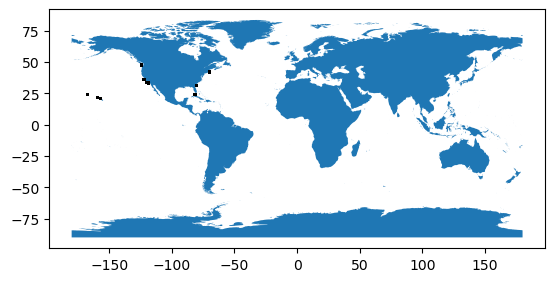

In [23]:
import cartopy.io.shapereader as shpreader
import matplotlib.pyplot as plt

fig, axs = plt.subplots(ncols=1,nrows=1)

land_shp_fname = shpreader.natural_earth(resolution='50m',
                                       category='physical', name='land')

gpd.read_file(land_shp_fname).plot(ax=axs)
   
gdf.plot(ax=axs, color='black', markersize=1)